In [2]:
import json
import sys

import numpy as np
import pandas as pd
import plotly
import plotly.express as px
from tqdm import tqdm
from matplotlib import pyplot as plt

In [14]:
first_timestamps = json.load(open(f'../../data/processed/train/first_timestamps.json'))
pbar = tqdm(first_timestamps, file=sys.stdout)
series = dict()
series_ids = list()
for series_id in pbar:
    data = pd.read_parquet(f'../../data/processed/train/labeled/{series_id}.parquet')
    series[series_id] = data
    series_ids.append(series_id)

100%|██████████| 277/277 [00:04<00:00, 67.33it/s] 


# Plot series

In [15]:
def masked_x(index: pd.Index, mask):
    """where the mask is false, replace the value with NaN, returns a copy"""
    x = index.to_numpy(copy=True, dtype=np.float32)
    x[~mask] = np.nan
    return x


def plot_data(series, title_id, feature, subsample=1, plot_limit=None, save=None, folder=None):
    series = series[:plot_limit:subsample]

    awake_0_x = masked_x(series.index, series['awake'] == 0)
    awake_1_x = masked_x(series.index, series['awake'] == 1)
    awake_2_x = masked_x(series.index, series['awake'] == 2)
    awake_3_x = masked_x(series.index, series['awake'] == 3)

    fig_anglez = px.line()
    fig_anglez.add_scatter(x=awake_0_x, y=series[feature], mode='lines', name='0 (Sleep)', line=dict(color='blue'))
    fig_anglez.add_scatter(x=awake_1_x, y=series[feature], mode='lines', name='1 (Awake)', line=dict(color='red'))
    fig_anglez.add_scatter(x=awake_2_x, y=series[feature], mode='lines', name='2 (NaN)', line=dict(color='green'))
    fig_anglez.add_scatter(x=awake_3_x, y=series[feature], mode='lines', name='3 (Unlabeled)', line=dict(color='grey'))
    fig_anglez.update_xaxes(title='Timestamp')
    fig_anglez.update_yaxes(title=feature)
    fig_anglez.update_layout(title=f'Series {title_id} - {feature} - Subsampled {subsample}x')

    # Show or save the plot
    if save is None:
        fig_anglez.show()
    elif save == 'html':
        plotly.offline.plot(fig_anglez, filename=f'../../plots/{title_id}-{feature}-{subsample}x.html', auto_open=False)
    else:
        if folder is None:
            folder = f'../../plots/{feature}'
        fig_anglez.write_image(f'{folder}/{title_id}-{subsample}x.{save}', width=2000, height=600)


# Compute last window diff to detect NaNs

In [16]:
# TODO: make this work using a similarity matrix between every window, 
# taking the minimum for each point across all comparisons
# currently takes ~5ms, if computing similarities between every window, it would take roughly 1sec per series, which is acceptable
def window_diff(series, feature):
    """Computes the similarity of each point to that at the same time in the last 24h hours"""
    STEPS_PER_DAY = (24 * 60 * 60) // 5

    if len(series) < STEPS_PER_DAY:
        return np.zeros(len(series))

    # pad the series to a multiple of steps per day
    feature_np = series[feature].to_numpy()
    padded = np.pad(feature_np, (0, STEPS_PER_DAY - (len(series) % STEPS_PER_DAY)), 'constant', constant_values=0)

    # compute the absolute difference between each day
    days = len(padded) // STEPS_PER_DAY
    comparison = np.empty((days, len(padded)))
    for day in range(days):
        day_data = padded[day * STEPS_PER_DAY: (day + 1) * STEPS_PER_DAY]
        tiled = np.tile(day_data, days)
        comparison[day] = np.abs(tiled - padded)

    # set the self comparisons to inf
    for day in range(days):
        comparison[day, day * STEPS_PER_DAY: (day + 1) * STEPS_PER_DAY] = np.inf

    # get the minimum
    diff = np.min(comparison, axis=0)

    return diff[:len(feature_np)]

In [17]:
sids = ['0cd1e3d0ed95', '038441c925bb']
for sid in tqdm(sids, file=sys.stdout):
    series[sid]['window_diff_anglez'] = window_diff(series[sid], 'anglez')
    plot_data(series[sid], sid, 'window_diff_anglez', 10, plot_limit=None, save=None)

  0%|          | 0/2 [00:00<?, ?it/s]

 50%|█████     | 1/2 [00:00<00:00,  6.29it/s]

100%|██████████| 2/2 [00:00<00:00,  5.39it/s]


In [12]:
def window_has_events(df):
    return df['awake'].diff().abs().sum() > 0


def plot_window(df):
    has_events = window_has_events(df)
    title = f'Series {sid} - Window {df["window"].iloc[0]}'
    folder = f'../../plots/window_diff_anglez/{"has" if has_events else "no"}_events'
    plot_data(df, title, 'window_diff_anglez', 10, plot_limit=None, save='jpg', folder=folder)


sids = series_ids[:2]
for sid in sids:
    data = series[sid]
    data['window_diff_anglez'] = window_diff(data, 'anglez')

    tqdm.pandas(desc=f'Processing {sid}', file=sys.stdout)
    data.groupby('window').progress_apply(plot_window)

Processing 03d92c9f6f8a: 100%|██████████| 43/43 [00:03<00:00, 11.90it/s]


# EDA based on labels and window_diff

In [18]:
num_windows = 0
for sid in series_ids:
    num_windows += series[sid].iloc[-1]['window'] + 1

stats = pd.DataFrame(columns=['series_id', 'window', 'onsets', 'awakes', 'fraction_zero_diff'])
i = 0
for sid in tqdm(series_ids, file=sys.stdout):
    series[sid]['window_diff_anglez'] = window_diff(series[sid], 'anglez')
    for window, data in series[sid].groupby('window'):
        stats.loc[i] = [sid,
                     window,
                     data['onset'].sum(),
                     data['wakeup'].sum(),
                     (data['window_diff_anglez'] == 0).mean()]
        i += 1

100%|██████████| 277/277 [00:24<00:00, 11.40it/s]


In [19]:
stats.to_csv('../../data/processed/train/stats.csv', index=False)

In [20]:
stats.head()

,series_id,window,onsets,awakes,fraction_zero_diff
0,038441c925bb,0,1,1,0.000059
1,038441c925bb,1,1,1,0.000000
2,038441c925bb,2,1,1,0.000174
3,038441c925bb,3,1,1,0.000521
4,038441c925bb,4,0,0,0.989583


In [21]:
stats[(stats['onsets'] > 1) | (stats['awakes'] > 1)]

,series_id,window,onsets,awakes,fraction_zero_diff
759,148471991ffb,17,1,2,0.000000
1457,2cd2340ca14d,7,1,2,0.001447
1880,3be1545083b7,14,2,1,0.000000


In [33]:
print(f'Number of windows: {num_windows}')
df = pd.DataFrame(columns=['onsets', 'awakes', 'count', 'fraction','zero_diff_mean'])
for o in range(3):
    for a in range(3):
        selection = stats[(stats["onsets"] == o) & (stats["awakes"] == a)]
        if len(selection) > 0:
            df.loc[len(df)] = [o, a, len(selection), len(selection) / num_windows, selection['fraction_zero_diff'].mean()]
df.astype({'onsets': 'int32', 'awakes': 'int32', 'count': 'int32'})

Number of windows: 7677.0


,onsets,awakes,count,fraction,zero_diff_mean
0,0,0,2876,0.374626,0.710888
1,0,1,7,0.000912,0.125033
2,1,0,5,0.000651,0.014583
3,1,1,4782,0.622900,0.024513
4,1,2,2,0.000261,0.000723
5,2,1,1,0.000130,0.000000


In [34]:
df_0_0 = stats[(stats['onsets'] == 0) & (stats['awakes'] == 0)]
df_1_1 = stats[(stats['onsets'] == 1) & (stats['awakes'] == 1)]
remainder = len(stats) - len(df_0_0) - len(df_1_1)
print(f'Windows that do not have 0,0 or 1,1 events account for {remainder / len(stats) * 100:.2f}% of the data')

Windows that do not have 0,0 or 1,1 events account for 0.20% of the data


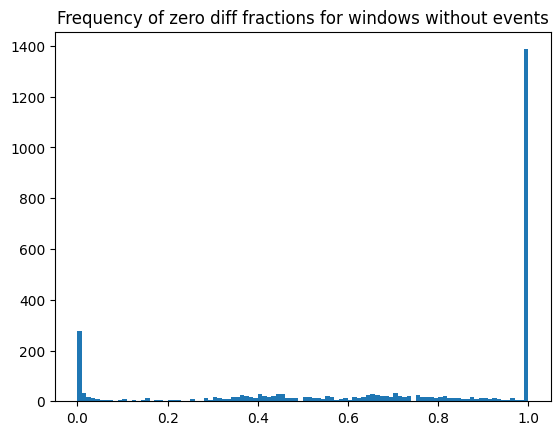

In [35]:
# Plot histograms of zero diff fraction for 1,1 and 0,0
plt.hist(df_0_0['fraction_zero_diff'], bins=100, label='0,0')
plt.title('Frequency of zero diff fractions for windows without events')
plt.show()

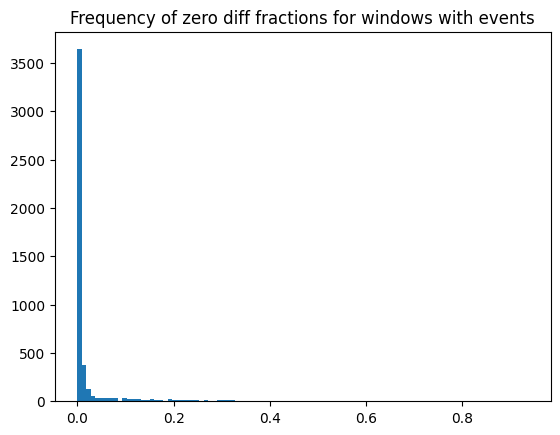

In [36]:
plt.hist(df_1_1['fraction_zero_diff'], bins=100, label='1,1')
plt.title('Frequency of zero diff fractions for windows with events')
plt.show()

There are some problematic windows:
Those where the similarity diff detects no repeating NaN pattern, but there are still no events in the labels.

In [37]:
problematic_windows = stats[(stats['fraction_zero_diff'] < 0.1) & (stats['onsets'] == 0) & (stats['awakes'] == 0)].copy()
lengths = problematic_windows.apply(
    lambda row: len(series[row.series_id][series[row.series_id]['window'] == row.window]), axis=1)
problematic_windows['length'] = lengths

print(f'Number of problematic windows: {len(problematic_windows)} ({len(problematic_windows) / num_windows * 100:.2f}%)')
long = problematic_windows[problematic_windows["length"] > 10000]
print(f'Of which longer than 10k steps {len(long)} ({len(long) / num_windows * 100:.2f}%)')
problematic_windows

Number of problematic windows: 373 (4.86%)
Of which longer than 10k steps 180 (2.34%)


,series_id,window,onsets,awakes,fraction_zero_diff,length
23,03d92c9f6f8a,0,0,0,0.000000,2160
66,0402a003dae9,0,0,0,0.000000,1620
90,04f547b8017d,0,0,0,0.000000,2160
128,05e1944c3818,0,0,0,0.000066,15120
136,05e1944c3818,8,0,0,0.000000,17280
...,...,...,...,...,...,...
7521,fb223ed2278c,0,0,0,0.000000,2160
7600,fbf33b1a2c10,24,0,0,0.000000,7200
7601,fcca183903b7,0,0,0,0.000000,1440
7638,fe90110788d2,0,0,0,0.000000,15480


In [38]:
print('Series with the most problematic windows, excluding short ones')
count = long.groupby('series_id').count()[['window']]
count.rename(columns={'window': 'problematic'}, inplace=True)
count['total'] = stats.groupby('series_id').count()[['window']]
count['fraction'] = count['problematic'] / count['total']
count.sort_values('fraction', ascending=False)

Series with the most problematic windows, excluding short ones


,problematic,total,fraction
series_id,,,
13b4d6a01d27,20,26,0.769231
05e1944c3818,16,24,0.666667
31011ade7c0a,22,33,0.666667
a596ad0b82aa,17,36,0.472222
60d31b0bec3b,11,27,0.407407
...,...,...,...
ccdee561ee5d,1,35,0.028571
416354edd92a,1,36,0.027778
601559e1777d,1,36,0.027778


# Make a ROC curve

Suggested threshold: 0.73, tpr: 0.98, fpr: 0.16
Suggested threshold: 0.73, tpr: 0.98, fpr: 0.16


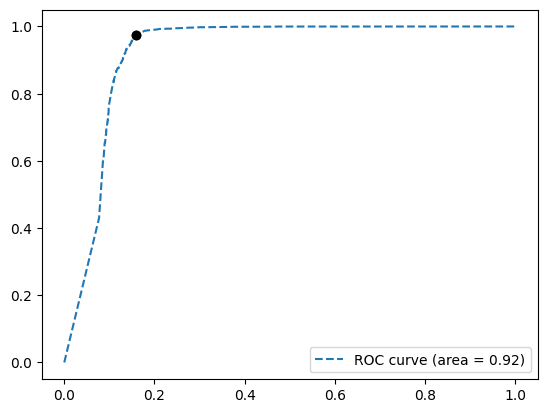

In [49]:
y = (stats['onsets'] > 0) & (stats['awakes'] > 0)
y_pred = 1-stats['fraction_zero_diff']

from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y, y_pred)
tnr = 1 - fpr
fnr = 1 - tpr

roc_auc = auc(fpr, tpr)

# plot the roc curve for the model
plt.plot(fpr, tpr, linestyle='--', label='ROC curve (area = %0.2f)' % roc_auc)
plt.legend()

# mark the optimal threshold, that maximizes tpr - fpr
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
plt.plot(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='black', label='Optimal threshold')
print(f'Suggested threshold: {optimal_threshold:.2f}, tpr: {tpr[optimal_idx]:.2f}, fpr: {fpr[optimal_idx]:.2f}')

plt.show()